In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 26.5 MB/s eta 0:00:00


In [1]:
#download data from kaggle and put in directory called deepglobe_dataset
!mkdir -p deepglobe_dataset
!kaggle datasets download -d balraj98/deepglobe-land-cover-classification-dataset -p deepglobe_dataset --unzip


Dataset URL: https://www.kaggle.com/datasets/balraj98/deepglobe-land-cover-classification-dataset
License(s): other
100% 2.74G/2.74G [02:30<00:00, 18.6MB/s]
100% 2.74G/2.74G [02:30<00:00, 19.5MB/s]


In [2]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, cohen_kappa_score

In [3]:
# Set directories
DATA_DIR = './deepglobe_dataset'
train_dir = os.path.join(DATA_DIR, "train")
class_dict_path = os.path.join(DATA_DIR, "class_dict.csv")

# Load class dictionary for color mapping
color_map = {}
class_dict = pd.read_csv(class_dict_path)
for idx, row in class_dict.iterrows():
    color = (row['r'], row['g'], row['b'])
    color_map[color] = idx

# Get class names and RGB values
class_names = class_dict['name'].tolist()
class_rgb_values = class_dict[['r', 'g', 'b']].values.tolist()

print('Classes:', class_names)
print('RGB values:', class_rgb_values)

Classes: ['urban_land', 'agriculture_land', 'rangeland', 'forest_land', 'water', 'barren_land', 'unknown']
RGB values: [[0, 255, 255], [255, 255, 0], [255, 0, 255], [0, 255, 0], [0, 0, 255], [255, 255, 255], [0, 0, 0]]


In [4]:
# Functions to process images and masks
def load_and_process_image(image_path):
    """Load and preprocess satellite image."""
    image = Image.open(image_path).convert('RGB')
    image = image.resize((256, 256))  # Resize to fixed dimensions
    return np.array(image)

def load_and_process_mask(mask_path):
    """Load and preprocess mask image."""
    mask = Image.open(mask_path).convert('RGB')
    mask = mask.resize((256, 256))
    mask_array = np.array(mask)
    class_mask = np.zeros(mask_array.shape[:2], dtype=np.int32)
    for color, class_idx in color_map.items():
        matches = (mask_array == color).all(axis=-1)
        class_mask[matches] = class_idx
    return class_mask

In [5]:
# Load training data
metadata_df = pd.read_csv(os.path.join(DATA_DIR, 'metadata.csv'))
metadata_df = metadata_df[metadata_df['split'] == 'train']
metadata_df = metadata_df[['image_id', 'sat_image_path', 'mask_path']]
metadata_df['sat_image_path'] = metadata_df['sat_image_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))
metadata_df['mask_path'] = metadata_df['mask_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))

# Shuffle and split data
metadata_df = metadata_df.sample(frac=1).reset_index(drop=True)
#valid_df = metadata_df.sample(frac=0.1, random_state=42)
#train_df = metadata_df.drop(valid_df.index)

# Take 10% of the training data
train_df = metadata_df.sample(frac=0.1, random_state=42)

# Prepare features (X) and labels (y)
X, y = [], []
for idx, row in train_df.iterrows():
    image = load_and_process_image(row['sat_image_path'])
    mask = load_and_process_mask(row['mask_path'])

    X.append(image.reshape(-1, 3))
    y.append(mask.flatten())

X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [6]:
# Train Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced")
rf.fit(X_train, y_train)

# Evaluate the model
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
kappa = cohen_kappa_score(y_test, y_pred)

print(f"Test Accuracy: {accuracy:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"Cohen's Kappa: {kappa:.2f}")

Test Accuracy: 0.50
F1 Score: 0.52
Cohen's Kappa: 0.33


In [ ]:
import joblib
# save
joblib.dump(rf, "my_random_forest.joblib")



['my_random_forest.joblib']

In [ ]:
import joblib
# load
loaded_rf = joblib.load("my_random_forest.joblib")

In [ ]:
# Train Random Forest model
rf2 = RandomForestClassifier(n_estimators=200, random_state=42, class_weight="balanced")
rf2.fit(X_train, y_train)

# Evaluate the model
y_pred2 = rf2.predict(X_test)
accuracy2 = accuracy_score(y_test, y_pred2)
print(f"Test Accuracy2: {accuracy2:.2f}")

Test Accuracy2: 0.42


In [12]:
# random for tuning
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced")

# Define parameter distributions
param_dist = {
    'n_estimators': randint(100, 500),
    'max_depth': [10, 20, 50, None],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20),
    'max_features': ['sqrt', 'log2', None]
}
rf = RandomForestClassifier(random_state=42, class_weight="balanced")

# Perform randomized search
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=50, cv=3, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

print("Best parameters:", random_search.best_params_)
best_rf = random_search.best_estimator_

# Predict and evaluate
y_pred = best_rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.2f}")


KeyboardInterrupt: 

In [ ]:
# grid search for tuning
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 50, None],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 5, 10],
}

# Initialize Random Forest
rf = RandomForestClassifier(random_state=42, class_weight="balanced")

# Perform grid search
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
best_rf = grid_search.best_estimator_

# Predict and evaluate
y_pred = best_rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.2f}")


Fitting 3 folds for each of 2 candidates, totalling 6 fits


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9)}

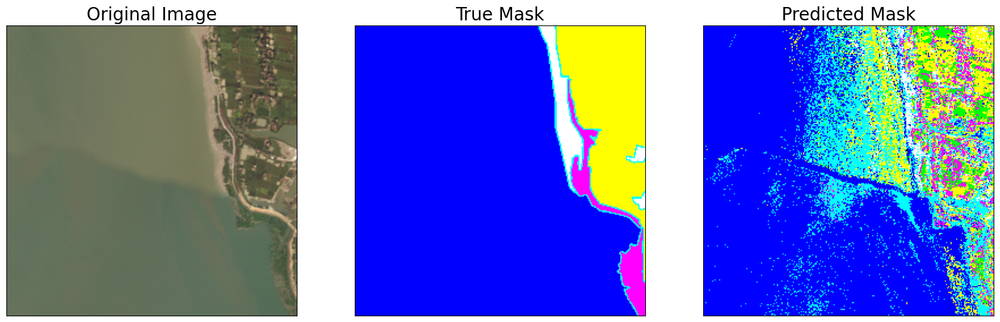

In [11]:
# Predict for a new image
#rf = best_rf
def classify_image(image_path):
    """Classify a new satellite image."""
    image = load_and_process_image(image_path)
    features = image.reshape(-1, 3)  # Flatten to match model input
    predictions = rf.predict(features)  # Predict classes
    return predictions.reshape(image.shape[:2])  # Reshape to original dimensions

# Visualization helpers
def visualize(**images):
    """Plot images side by side."""
    n_images = len(images)
    plt.figure(figsize=(20, 8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name.replace('_', ' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

def colour_code_segmentation(image, label_values):
    """Color code the segmentation result."""
    colour_codes = np.array(label_values)
    return colour_codes[image.astype(int)]

valid_df = metadata_df.drop(train_df.index)
# Test classification and visualize results
test_image_path = valid_df.iloc[1]['sat_image_path']
test_mask_path = valid_df.iloc[1]['mask_path']

# Process the test image and mask
test_image = load_and_process_image(test_image_path)
test_mask = load_and_process_mask(test_mask_path)

# Predict and color code
classified_mask = classify_image(test_image_path)
color_mask = colour_code_segmentation(classified_mask, class_rgb_values)

# Visualize results
visualize(Original_Image=test_image, True_Mask=colour_code_segmentation(test_mask, class_rgb_values),
          Predicted_Mask=color_mask)

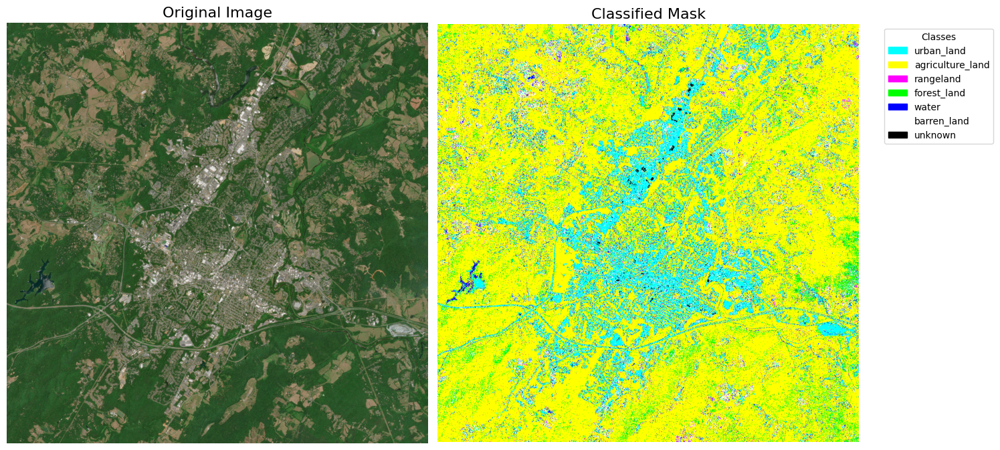

In [ ]:
import cv2
import matplotlib.patches as mpatches

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (1024,1024), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./charlottesville.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

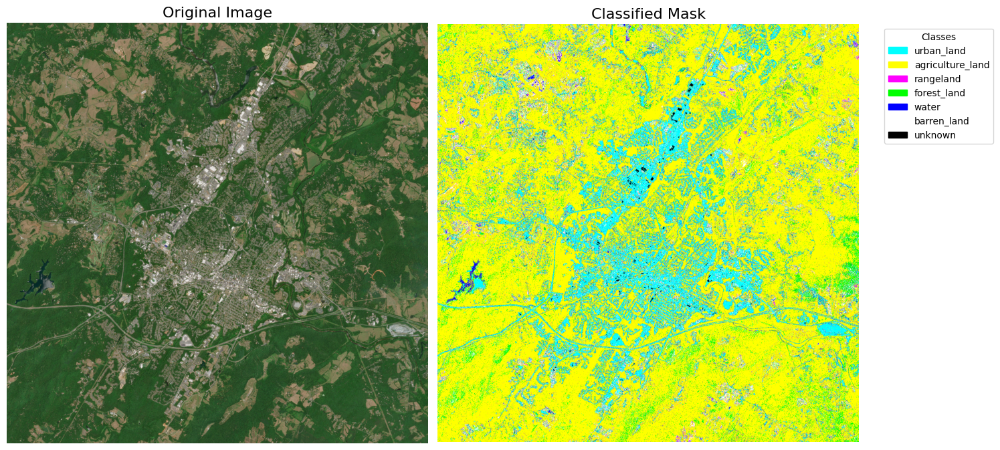

In [ ]:
import cv2
import matplotlib.patches as mpatches

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (2048,2048), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./charlottesville.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

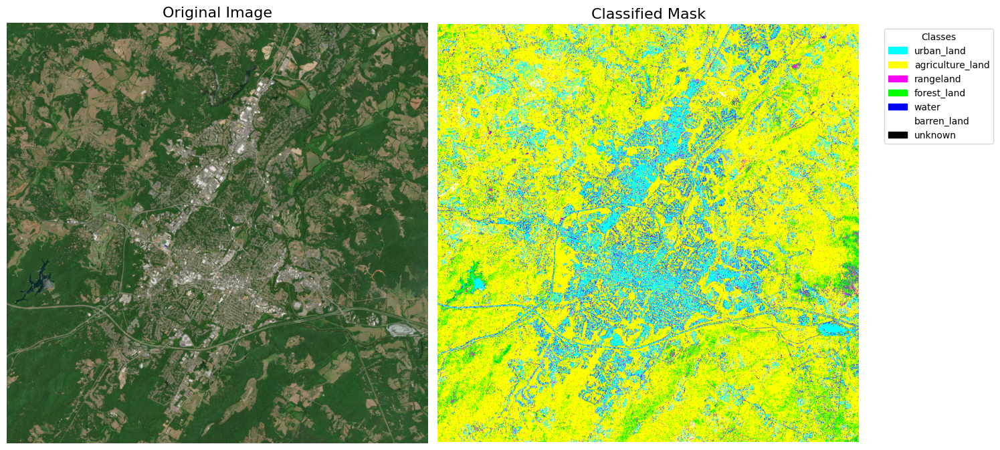

In [ ]:
import cv2
import matplotlib.patches as mpatches

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (1024,1024), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./charlottesville.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

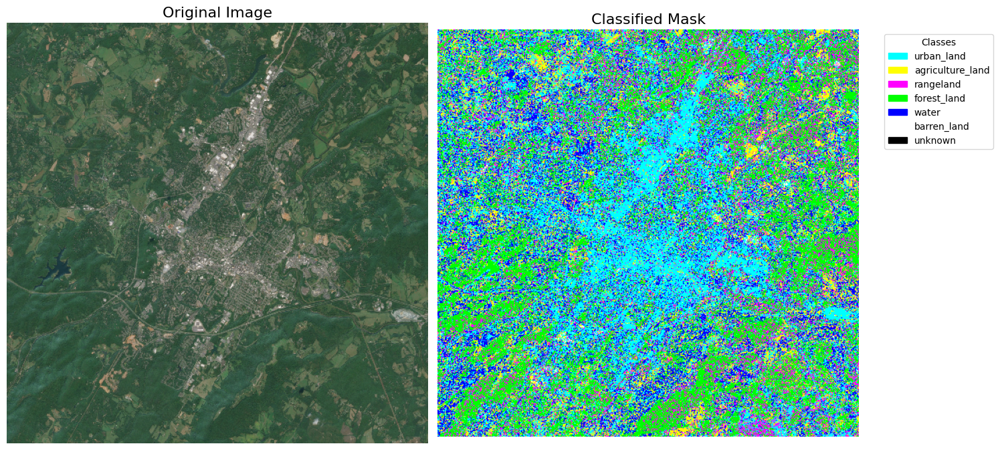

In [ ]:
import cv2
import matplotlib.patches as mpatches

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (512,512), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./CSV201709.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

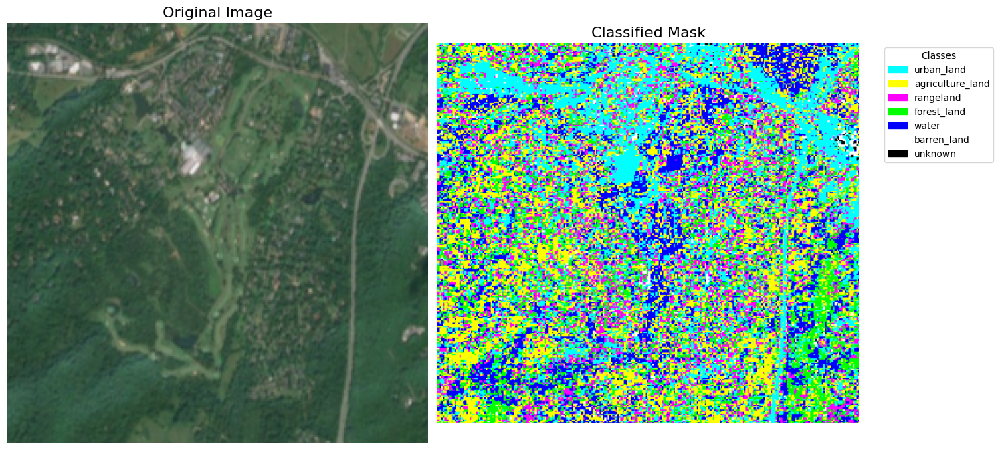

In [ ]:
import cv2
import matplotlib.patches as mpatches

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (256,256), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./pCSV201709.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

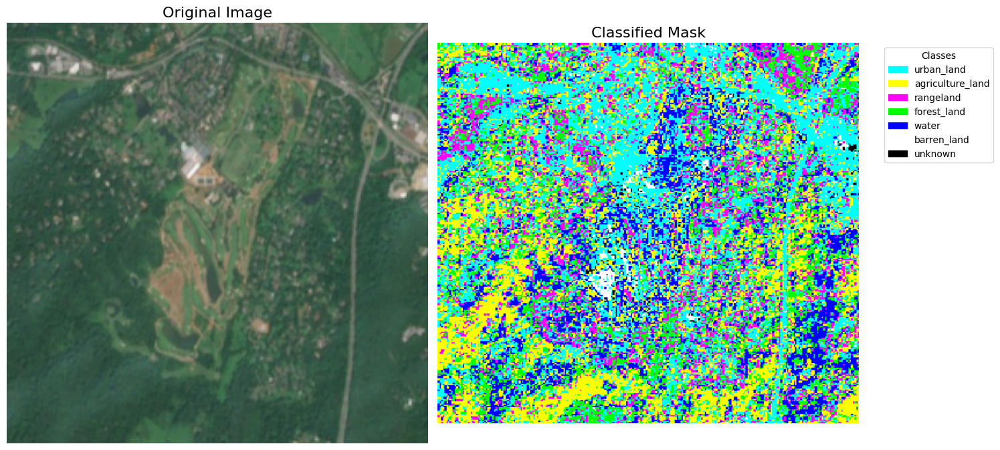

In [ ]:
# Path to the input image
input_image_path = "./pCSV202008.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

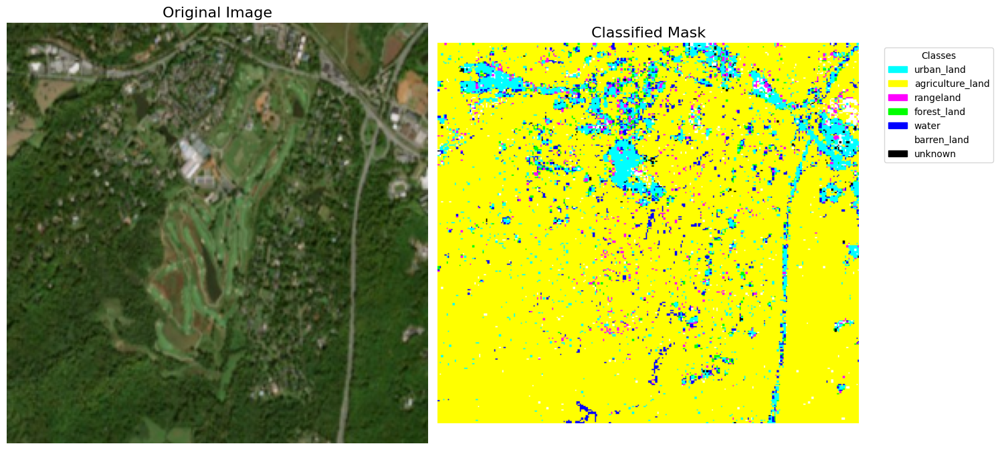

In [ ]:
# Path to the input image
input_image_path = "./pCSV202410.jpg"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

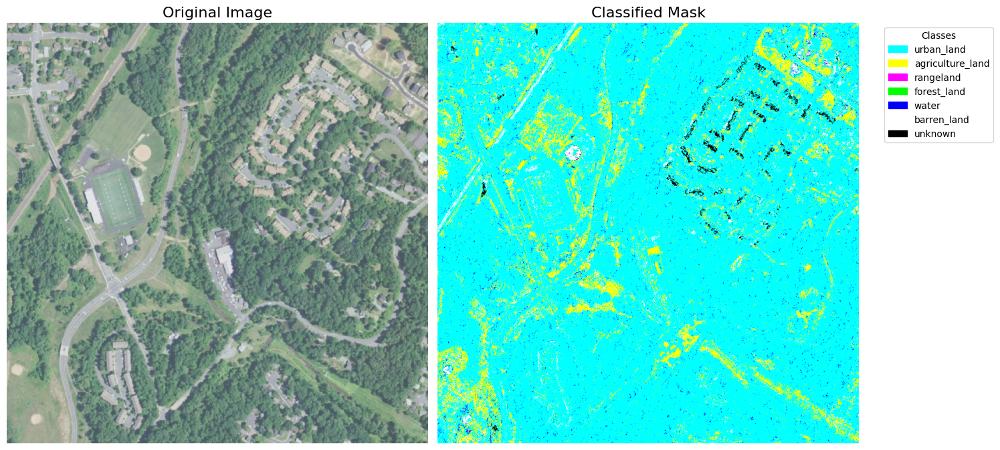

In [ ]:
import cv2
import matplotlib.patches as mpatches
def classify_image(image_path):
    """Classify a new satellite image."""
    image = load_and_process_image(image_path)
    features = image.reshape(-1, 3)  # Flatten to match model input
    predictions = rf.predict(features)  # Predict classes
    return predictions.reshape(image.shape[:2])  # Reshape to original dimensions

# Visualization helpers
def visualize(**images):
    """Plot images side by side."""
    n_images = len(images)
    plt.figure(figsize=(20, 8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name.replace('_', ' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

def colour_code_segmentation(image, label_values):
    """Color code the segmentation result."""
    colour_codes = np.array(label_values)
    return colour_codes[image.astype(int)]

def visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names):
    plt.figure(figsize=(15, 10))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=16)
    plt.imshow(resized_image)
    plt.axis("off")

    # Plot the classified mask
    plt.subplot(1, 2, 2)
    plt.title("Classified Mask", fontsize=16)
    plt.imshow(classified_mask)
    plt.axis("off")

    # Add a legend mapping RGB values to class names
    legend_patches = [
        mpatches.Patch(color=np.array(rgb) / 255.0, label=class_name)
        for rgb, class_name in zip(class_rgb_values, class_names)
    ]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", title="Classes")

    plt.tight_layout()
    plt.show()

def load_image(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image to the same dimensions used during training
    resized_image = cv2.resize(image, (1024,1024), interpolation=cv2.INTER_LINEAR)
    return resized_image, image.shape[:2]  # Return resized image and original shape

def classify_image(image_path, model, class_rgb_values):
    # Load and preprocess the image
    resized_image, original_shape = load_image(image_path)

    # Flatten the resized image for prediction
    flattened_features = resized_image.reshape(-1, 3)

    # Predict the classes for each pixel
    predicted_labels = model.predict(flattened_features)

    classified_mask = predicted_labels.reshape(resized_image.shape[:2])

    final_mask = cv2.resize(classified_mask, original_shape[::-1], interpolation=cv2.INTER_NEAREST)

    color_mask = colour_code_segmentation(final_mask, class_rgb_values)

    return color_mask, resized_image

# Path to the input image
input_image_path = "./cv16.png"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, loaded_rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)

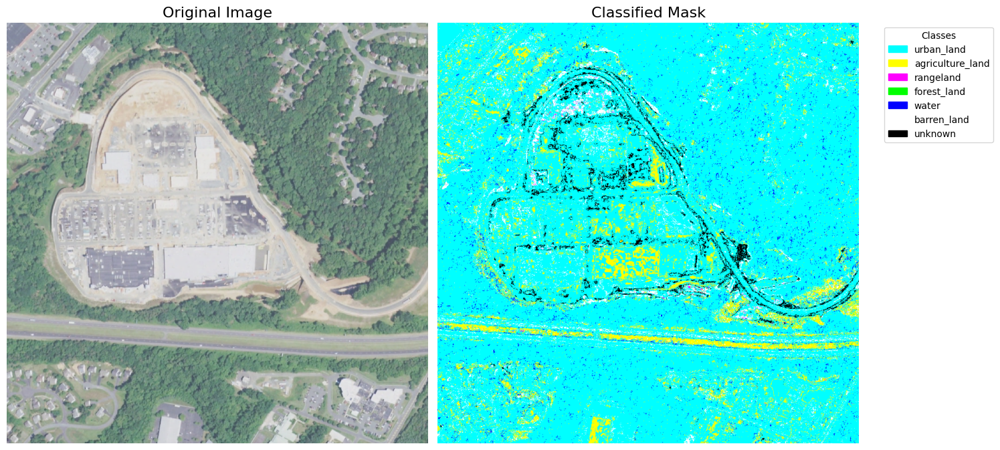

In [ ]:
# Path to the input image
input_image_path = "./cv16_2.png"

# Use the trained Random Forest model to classify the image
classified_mask, resized_image = classify_image(input_image_path, loaded_rf, class_rgb_values)

# Visualize the original and classified images
#visualize(Original_Image=resized_image, Classified_Mask=classified_mask)
visualize_with_legend(classified_mask, resized_image, class_rgb_values, class_names)